In [ ]:
# === [TFM_newcodes] redireccion de figuras a la carpeta ./figures/ ===
# Celda anadida automaticamente: cualquier figura guardada con un nombre
# de fichero simple (sin carpeta) se guarda dentro de ./figures/.
# Las rutas que ya incluyen una carpeta (p.ej. 'figures/...') se respetan.
import os as _os
import matplotlib.pyplot as _plt
from matplotlib.figure import Figure as _Figure
_os.makedirs('figures', exist_ok=True)
def _fig_redirect(fname):
    try:
        p = _os.fspath(fname)
    except TypeError:
        return fname  # objeto tipo fichero/buffer: no tocar
    if _os.path.dirname(p) == '':
        p = _os.path.join('figures', p)
    d = _os.path.dirname(p)
    if d:
        _os.makedirs(d, exist_ok=True)
    return p
if not getattr(_plt.savefig, '_tfm_patched', False):
    _orig_plt_savefig = _plt.savefig
    _orig_fig_savefig = _Figure.savefig
    def _plt_savefig(fname, *a, **k):
        return _orig_plt_savefig(_fig_redirect(fname), *a, **k)
    _plt_savefig._tfm_patched = True
    def _fig_savefig(self, fname, *a, **k):
        return _orig_fig_savefig(self, _fig_redirect(fname), *a, **k)
    _plt.savefig = _plt_savefig
    _Figure.savefig = _fig_savefig
savefig = _plt.savefig  # por si se usa savefig(...) directamente


# Misinformation Analysis: Cascades

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import powerlaw
from scipy import stats

In [ ]:
# Load the datasets
df = pd.read_json("../../Datasets/voluntariosdanavalencia_old.json") # Import data from Voluntarios de Valencia groupchat.
df_links = pd.read_csv("../../Datasets/voluntariosdanavalencia_extracted_links.csv") # Import data from Voluntarios de Valencia groupchat with messages with links and misinformation score.
df_users = pd.read_csv("../../Datasets/voluntariosdanavalencia_extracted_users.csv") # Import data from Voluntarios de Valencia groupchat with user information.

## Extract misinformation and informative messages

In [ ]:
# Check possible values for fake_information column in df_links
print(df_links['fake_information'].unique())

<StringArray>
[             nan,        'unknown',           'high',          'Mixed',
            'low',           'True', 'mostly factual',      'very high',
          'mixed',       'very-low']
Length: 10, dtype: str


In [ ]:
# Gather the messages with misinformation
misinformation_levels = ['Mixed', 'low', 'True', 'mixed', 'very-low']
# Gather messages with those values in the "fake information" column
misinformation_messages = df_links[df_links['fake_information'].isin(misinformation_levels)]
# Gather messages with "high" or "very-high" misinformation score
informative_messages = df_links[df_links['fake_information'].isin(['high', 'very high', 'mostly factual', np.nan])] # idk if I should add nan values, but I will do it just in case


Try to gather the misinformation & informative messages from the misinformation dataset into the df dataframe.

In [ ]:
# Work on copies of the datasets to avoid modifying the original ones
mis = misinformation_messages.copy()
inf = informative_messages.copy()
full = df.copy()

# Normalize sender_id type
mis["sender_id"]= pd.to_numeric(mis["sender_id"], errors='coerce').astype('Int64')
inf["sender_id"]= pd.to_numeric(inf["sender_id"], errors='coerce').astype('Int64')
full["sender_id"]= pd.to_numeric(full["sender_id"], errors='coerce').astype('Int64')

# normalize date to UTC datatime
mis["date_dt"] = pd.to_datetime(mis["date"], errors='coerce', utc=True)
inf["date_dt"] = pd.to_datetime(inf["date"], errors='coerce', utc=True)
full["date_dt"] = pd.to_datetime(full["date"], errors='coerce', utc=True)

# Exact match of sender_id in df_users and mis/inf datasets and date
matches_mis = mis.merge(
    full,
    on=["sender_id", "date_dt"],
    how="left",
    suffixes=("_mis","_df")
)
matches_inf = inf.merge(
    full,
    on=["sender_id", "date_dt"],
    how="left",
    suffixes=("_inf","_df")
)   

# Found vs not found matches
found_mis = matches_mis[~matches_mis['id'].isna()]
not_found_mis = matches_mis[matches_mis['id'].isna()]
found_inf = matches_inf[~matches_inf['id'].isna()]
not_found_inf = matches_inf[matches_inf['id'].isna()]

print(f"Found matches in misinformation messages: {len(found_mis)}")
print(f"Found matches in informative messages: {len(found_inf)}")
print(f"Not found matches in misinformation messages: {len(not_found_mis)}")
print(f"Not found matches in informative messages: {len(not_found_inf)}")



Found matches in misinformation messages: 182
Found matches in informative messages: 1957
Not found matches in misinformation messages: 0
Not found matches in informative messages: 7


## Temporal analysis of cascades of messages

In [ ]:
def prepare_full_events(df):
    """Prepare the full events DataFrame by converting 'id' and 'sender_id' to numeric types, and 'date' to datetime format. Rows with invalid data will be dropped."""
    full_copy = df.copy() # Create a copy of the original DataFrame to avoid modifying it
    full_copy["id"]=pd.to_numeric(full_copy["id"], errors='coerce').astype('Int64') # Convert 'id' to numeric, coercing errors to NaN, and then to Int64
    full_copy["sender_id"]= pd.to_numeric(full_copy["sender_id"], errors='coerce').astype('Int64') # Convert 'sender_id' to numeric, coercing errors to NaN, and then to Int64
    full_copy["date_dt"] = pd.to_datetime(full_copy["date"], errors='coerce', utc=True) # Convert 'date' to datetime, coercing errors to NaT, and ensuring UTC timezone
    full_copy = full_copy.dropna(subset=[["id", "sender_id", "date_dt"]]).copy() # Drop rows with NaN values in 'id', 'sender_id', or 'date_dt' and create a copy of the resulting DataFrame
    return full_copy

def build_link_id_lookup(links_df, full_df):
    """Build a lookup DataFrame by merging the links DataFrame with the full events DataFrame on 'sender_id' and 'date_dt'. Only rows with valid matches will be retained."""
    links_copy = links_df.copy() # Create a copy of the links DataFrame to avoid modifying the original
    links_copy["sender_id"]= pd.to_numeric(links_copy["sender_id"], errors='coerce').astype('Int64') # Convert 'sender_id' to numeric, coercing errors to NaN, and then to Int64
    links_copy["date_dt"] = pd.to_datetime(links_copy["date"], errors='coerce', utc=True) # Convert 'date' to datetime, coercing errors to NaT, and ensuring UTC timezone
    full_lookup =full_df[["id", "sender_id", "date_dt"]].drop_duplicates().copy() # Create a copy of the relevant columns from the full DataFrame for lookup, dropping duplicates
    merged = links_copy.merge(
        full_lookup, on=["sender_id", "date_dt"], how="left", suffixes=("_links", "_full")
    ) # Merge the links DataFrame with the full lookup DataFrame on 'sender_id'
    merged = merged.dropna(subset=["id"]).copy() # Drop rows where 'id' is NaN and create a copy of the resulting DataFrame
    merged["id"] = merged["id"].astype('Int64') # Convert 'id' to Int64 type after dropping NaN values
    return merged

def collect_waiting_times(full_df, sources_df, max_waiting_time=600):
    """ Collect waiting times between consecutive events in a cascade around source events. 
    The cascade is defined as events connected by waiting times less than max_waiting_time (in seconds).
    The cascade expands before and after the source event until a gap > max_waiting_time is found.
    Waiting times are calculated as differences between consecutive events in the cascade."""
    
    full_local = full_df.copy() # Create a copy of the full DataFrame to avoid modifying the original
    sources_local = sources_df[["id", "date_dt", "topic_name"]].dropna().drop_duplicates(subset=["id"]).copy() # Create a copy of the relevant columns from the sources DataFrame
    
    max_delta = pd.Timedelta(seconds=max_waiting_time) # Define the maximum waiting time threshold in seconds (default 600s = 10 minutes)
    waiting_times = [] # Initialize a list to store waiting times
    
    for _, src in sources_local.iterrows(): # Iterate over each source event in the sources DataFrame
        same_topic = full_local[full_local["topic_name"] == src["topic_name"]].copy() # Filter the full DataFrame to get events with the same topic as the source event
        same_topic = same_topic.sort_values("date_dt").reset_index(drop=True).copy() # Sort by date and reset index for easier indexing
        
        # Find the index of the source event in the sorted dataframe
        src_indices = same_topic[same_topic["date_dt"] == src["date_dt"]].index.tolist() # Find all indices where date matches
        if not src_indices: # Skip if source event not found in same_topic
            continue
        src_idx = src_indices[0] # Get the first match
        
        # Build cascade going backwards from source: include events while waiting time <= max_waiting_time
        cascade_start_idx = src_idx
        for i in range(src_idx - 1, -1, -1):
            delta = same_topic.iloc[i+1]["date_dt"] - same_topic.iloc[i]["date_dt"] # Calculate waiting time from event i to i+1
            if delta <= max_delta: # If waiting time is within threshold, include this event
                cascade_start_idx = i
            else: # Stop when gap exceeds threshold
                break
        
        # Build cascade going forwards from source: include events while waiting time <= max_waiting_time
        cascade_end_idx = src_idx
        for i in range(src_idx + 1, len(same_topic)):
            delta = same_topic.iloc[i]["date_dt"] - same_topic.iloc[i-1]["date_dt"] # Calculate waiting time from event i-1 to i
            if delta <= max_delta: # If waiting time is within threshold, include this event
                cascade_end_idx = i
            else: # Stop when gap exceeds threshold
                break
        
        # Extract the cascade (inclusive range)
        cascade = same_topic.iloc[cascade_start_idx:cascade_end_idx+1].copy()
        
        if not cascade.empty: # Check if there are any events in the cascade
            # Sort events by date and calculate differences between consecutive events in the cascade
            cascade_sorted = cascade.sort_values("date_dt")
            deltas = cascade_sorted["date_dt"].diff().dt.total_seconds() # Calculate waiting times between consecutive events
            deltas = deltas.dropna()  # Remove NaT from the first event
            waiting_times.extend(deltas)
    
    return waiting_times # Return the list of waiting times

def fit_cascade_distributions(full_df, sources_df, max_waiting_time=600, discrete=True):
    """Fit TPL and Poisson distributions to each cascade around source events.
    Returns a DataFrame with distribution parameters for each cascade."""
    
    full_local = full_df.copy()
    sources_local = sources_df[["id", "date_dt", "topic_name"]].dropna().drop_duplicates(subset=["id"]).copy()
    
    max_delta = pd.Timedelta(seconds=max_waiting_time)
    results = []
    
    for idx, src in sources_local.iterrows():
        same_topic = full_local[full_local["topic_name"] == src["topic_name"]].copy()
        same_topic = same_topic.sort_values("date_dt").reset_index(drop=True).copy()
        
        src_indices = same_topic[same_topic["date_dt"] == src["date_dt"]].index.tolist()
        if not src_indices:
            continue
        src_idx = src_indices[0]
        
        cascade_start_idx = src_idx
        for i in range(src_idx - 1, -1, -1):
            delta = same_topic.iloc[i+1]["date_dt"] - same_topic.iloc[i]["date_dt"]
            if delta <= max_delta:
                cascade_start_idx = i
            else:
                break
        
        cascade_end_idx = src_idx
        for i in range(src_idx + 1, len(same_topic)):
            delta = same_topic.iloc[i]["date_dt"] - same_topic.iloc[i-1]["date_dt"]
            if delta <= max_delta:
                cascade_end_idx = i
            else:
                break
        
        cascade = same_topic.iloc[cascade_start_idx:cascade_end_idx+1].copy()
        
        if not cascade.empty:
            cascade_sorted = cascade.sort_values("date_dt")
            deltas = cascade_sorted["date_dt"].diff().dt.total_seconds()
            deltas = deltas.dropna()
            
            data = np.asarray(deltas, dtype=float)
            data = data[np.isfinite(data)]
            data = data[data > 0]
            
            if len(data) >= 3:
                result = {"source_id": src["id"], "cascade_size": len(cascade), "waiting_times_count": len(data)}
                
                # Fit Truncated Power Law
                try:
                    fit_tpl = powerlaw.Fit(data, discrete=discrete, verbose=False)
                    tpl = fit_tpl.truncated_power_law
                    result["tpl_alpha"] = getattr(tpl, "alpha", np.nan)
                    result["tpl_lambda"] = getattr(tpl, "Lambda", np.nan)
                    result["tpl_xmin"] = getattr(tpl, "xmin", np.nan)
                    result["tpl_sigma"] = getattr(tpl, "sigma", np.nan)
                except Exception:
                    result["tpl_alpha"] = np.nan
                    result["tpl_lambda"] = np.nan
                    result["tpl_xmin"] = np.nan
                    result["tpl_sigma"] = np.nan
                
                # Poisson statistics computed directly from data
                try:
                    result["poisson_lambda"] = np.mean(data)   # For Poisson, lambda == mean
                    result["poisson_mean"] = np.mean(data)
                    result["poisson_std"] = np.std(data)
                except Exception:
                    result["poisson_lambda"] = np.nan
                    result["poisson_mean"] = np.nan
                    result["poisson_std"] = np.nan
                
                result["data_min"] = np.min(data)
                result["data_max"] = np.max(data)
                result["data_median"] = np.median(data)
                
                results.append(result)
    
    return pd.DataFrame(results)

def fit_tpl_report(waiting_times_input, label, discrete=True):
    """Fit truncated power law to waiting times and generate comprehensive report with statistics and visualizations."""
    
    # Convert input to numpy array and clean data: remove infinities and non-positive values
    data_tpl = np.asarray(waiting_times_input, dtype=float)
    data_tpl = data_tpl[np.isfinite(data_tpl)]  # Remove infinite values
    data_tpl = data_tpl[data_tpl > 0]  # Keep only positive values

    # Check if we have enough data points to perform reliable fitting
    if len(data_tpl) < 20:
        print("=" * 70)
        print(f"{label}: Not enough data to fit reliably (n={len(data_tpl)}).")
        print("=" * 70)
        return None

    # Fit the truncated power law distribution to the data
    fit_tpl = powerlaw.Fit(data_tpl, discrete=discrete, verbose=False)
    tpl = fit_tpl.truncated_power_law

    # Extract power law parameters
    alpha_tpl = getattr(tpl, "alpha", np.nan)  # Power law exponent
    lambda_tpl = getattr(tpl, "Lambda", np.nan)  # Exponential cutoff rate
    xmin_tpl = getattr(tpl, "xmin", np.nan)  # Minimum value where power law applies
    sigma_tpl = getattr(tpl, "sigma", np.nan)  # Uncertainty in alpha

    # Print truncated power law fit results
    print("=" * 70)
    print(f"TRUNCATED POWER LAW FIT RESULTS: {label}")
    print("=" * 70)
    print(f"alpha: {alpha_tpl:.4f}")  # Power law exponent
    print(f"lambda: {lambda_tpl:.6f}")  # Exponential cutoff
    print(f"xmin: {xmin_tpl:.4f}")  # Minimum threshold
    print(f"sigma: {sigma_tpl:.4f}")  # Standard error
    n_tail_tpl = int(np.sum(data_tpl >= xmin_tpl))  # Count data points above xmin
    print(f"Data points above xmin: {n_tail_tpl} / {len(data_tpl)} ({100 * n_tail_tpl / len(data_tpl):.2f}%)")

    # Compare truncated power law with alternative distributions
    print("\n" + "=" * 70)
    print("TRUNCATED POWER LAW COMPARISONS")
    print("=" * 70)
    comparisons = [
        ("truncated_power_law", "power_law", "Truncated PL vs Power Law"),
        ("truncated_power_law", "lognormal", "Truncated PL vs Lognormal"),
        ("truncated_power_law", "exponential", "Truncated PL vs Exponential"),
    ]

    # Perform likelihood ratio tests for each comparison
    for d1, d2, cmp_label in comparisons:
        R, p = fit_tpl.distribution_compare(d1, d2, normalized_ratio=True)  # Normalized likelihood ratio
        print(f"\n{cmp_label}:")
        print(f"  R = {R:.4f}, p = {p:.4f}")
        if p < 0.05:  # Statistically significant at p < 0.05
            if R > 0:
                print("  Truncated power law is significantly better")
            else:
                print(f"  {d2.replace('_', ' ')} is significantly better")
        else:
            print("  No significant difference")

    # Calculate Kolmogorov-Smirnov test statistic and p-value for goodness-of-fit
    tail_tpl = np.sort(data_tpl[data_tpl >= xmin_tpl])  # Get data points in the tail
    if len(tail_tpl) == 0:
        ks_tpl = float("nan")
        ks_p_tpl = float("nan")
    else:
        empirical_cdf_tpl = np.arange(1, len(tail_tpl) + 1) / len(tail_tpl)  # Empirical CDF
        try:
            model_cdf_tpl = tpl.cdf(tail_tpl)  # Model CDF
        except Exception:
            model_cdf_tpl = 1 - tpl.ccdf(tail_tpl)  # Use CCDF if CDF fails
        ks_tpl = np.max(np.abs(empirical_cdf_tpl - model_cdf_tpl))  # Maximum distance between CDFs
        ks_stat_tpl, ks_p_tpl = stats.kstest(tail_tpl, tpl.cdf)  # KS test

    # Print KS test results
    print("\n" + "=" * 70)
    print(f"KS distance (truncated power law): {ks_tpl:.4f}")
    print(f"KS p-value (tail): {ks_p_tpl:.6g}")
    print("=" * 70)

    # Create visualization with PDF and CCDF plots
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Plot probability density function (PDF)
    fit_tpl.plot_pdf(color="black", linewidth=2, label="Empirical Data", ax=axes[0])
    tpl.plot_pdf(
        color="crimson", linestyle="--", linewidth=2,
        label=f"Truncated PL (alpha={alpha_tpl:.2f}, lambda={lambda_tpl:.4f})", ax=axes[0]
    )
    fit_tpl.power_law.plot_pdf(color="royalblue", linestyle="--", linewidth=1.8, label="Power Law", ax=axes[0])
    fit_tpl.lognormal.plot_pdf(color="darkorange", linestyle="--", linewidth=1.8, label="Lognormal", ax=axes[0])
    axes[0].set_xlabel("Waiting Time (seconds)")
    axes[0].set_ylabel("P(X = x)")
    axes[0].set_title(f"PDF: {label}")
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    # Plot complementary cumulative distribution function (CCDF)
    fit_tpl.plot_ccdf(color="black", linewidth=2, label="Empirical Data", ax=axes[1])
    tpl.plot_ccdf(
        color="crimson", linestyle="--", linewidth=2,
        label=f"Truncated PL (alpha={alpha_tpl:.2f}, lambda={lambda_tpl:.4f})", ax=axes[1]
    )
    fit_tpl.power_law.plot_ccdf(color="royalblue", linestyle="--", linewidth=1.8, label="Power Law", ax=axes[1])
    fit_tpl.lognormal.plot_ccdf(color="darkorange", linestyle="--", linewidth=1.8, label="Lognormal", ax=axes[1])
    axes[1].set_xlabel("Waiting Time (seconds)")
    axes[1].set_ylabel("P(X > x)")
    axes[1].set_title(f"CCDF: {label}")
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    return fit_tpl

def fit_poisson_report(waiting_times_input, label, discrete=False):
    """Fit exponential distribution (continuous analog of Poisson) to waiting times and generate report with statistics and visualizations."""
    
    # Convert input to numpy array and clean data: remove infinities and non-positive values
    data_exp = np.asarray(waiting_times_input, dtype=float)
    data_exp = data_exp[np.isfinite(data_exp)]  # Remove infinite values
    data_exp = data_exp[data_exp > 0]  # Keep only positive values

    # Check if we have enough data points to perform reliable fitting
    if len(data_exp) < 20:
        print("=" * 70)
        print(f"{label}: Not enough data to fit reliably (n={len(data_exp)}).")
        print("=" * 70)
        return None

    # Fit exponential distribution (scale parameter = 1/lambda for Poisson rate)
    from scipy.stats import expon
    params_exp = expon.fit(data_exp)  # Returns (loc, scale)
    loc_exp, scale_exp = params_exp
    lambda_exp = 1 / scale_exp if scale_exp > 0 else np.nan  # Convert scale to rate parameter
    
    # Print exponential fit results
    print("=" * 70)
    print(f"EXPONENTIAL FIT RESULTS: {label}")
    print("=" * 70)
    print(f"Location (loc): {loc_exp:.4f}")  # Location parameter
    print(f"Scale (1/lambda): {scale_exp:.4f}")  # Scale parameter
    print(f"Rate (lambda): {lambda_exp:.6f}")  # Rate parameter (inverse of scale)
    print(f"Mean: {np.mean(data_exp):.4f}")  # Mean of data
    print(f"Std Dev: {np.std(data_exp):.4f}")  # Standard deviation
    print(f"Data points: {len(data_exp)}")

    # Perform Kolmogorov-Smirnov test for goodness-of-fit
    ks_stat_exp, ks_p_exp = stats.kstest(data_exp, lambda x: expon.cdf(x, loc_exp, scale_exp))

    # Print KS test results
    print("\n" + "=" * 70)
    print(f"KS statistic (exponential): {ks_stat_exp:.4f}")
    print(f"KS p-value: {ks_p_exp:.6g}")
    print("=" * 70)

    # Create visualization with histogram and fitted distribution
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Plot histogram with fitted exponential PDF
    x_range = np.linspace(data_exp.min(), data_exp.max(), 200)
    pdf_exp = expon.pdf(x_range, loc_exp, scale_exp)
    
    axes[0].hist(data_exp, bins=30, density=True, alpha=0.6, color="skyblue", edgecolor="black", label="Empirical Data")
    axes[0].plot(x_range, pdf_exp, "r--", linewidth=2, label=f"Exponential Fit (λ={lambda_exp:.4f})")
    axes[0].set_xlabel("Waiting Time (seconds)")
    axes[0].set_ylabel("Density")
    axes[0].set_title(f"PDF: {label}")
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    # Plot empirical CCDF vs fitted CCDF
    sorted_data = np.sort(data_exp)
    empirical_ccdf = 1 - np.arange(1, len(sorted_data) + 1) / len(sorted_data)
    fitted_ccdf = 1 - expon.cdf(sorted_data, loc_exp, scale_exp)
    
    axes[1].plot(sorted_data, empirical_ccdf, "bo-", alpha=0.6, linewidth=1, markersize=4, label="Empirical CCDF")
    axes[1].plot(x_range, 1 - expon.cdf(x_range, loc_exp, scale_exp), "r--", linewidth=2, label="Fitted Exponential CCDF")
    axes[1].set_xlabel("Waiting Time (seconds)")
    axes[1].set_ylabel("P(X > x)")
    axes[1].set_title(f"CCDF: {label}")
    axes[1].set_yscale("log")
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    return {"lambda": lambda_exp, "scale": scale_exp, "loc": loc_exp, "ks_stat": ks_stat_exp, "ks_p": ks_p_exp}

In [ ]:
# Fit TPL and Poisson distributions to each misinformation cascade and calculate parameters
cascade_params_mis = fit_cascade_distributions(full, found_mis, max_waiting_time=600, discrete=False)

print("=" * 70)
print("MISINFORMATION CASCADE DISTRIBUTION FITS")
print("=" * 70)
print(f"Total cascades analyzed: {len(cascade_params_mis)}")
print("\nSummary statistics:")
print(cascade_params_mis[["cascade_size", "waiting_times_count", "tpl_alpha", "tpl_lambda", "poisson_lambda"]].describe())
print("\nFirst 10 cascades:")
print(cascade_params_mis.head(10))


/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/fitting.py:528: UserWarning: No valid values for xmin found.
  warnings.warn('No valid values for xmin found.')
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:183: UserWarning: discrete=False but data exclusively contains integer values. Consider using discrete=True.
  warnings.warn('discrete=False but data exclusively contains integer values. Consider using discrete=True.')
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:743: OptimizeWarning: Initial guess is not within the specified bounds
  result = scipy.optimize.minimize(fit_function,
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:808: UserWarning: Fitted parameters are very close to the edge of parameter ranges for distribution truncated_power_law; consider changing the

MISINFORMATION CASCADE DISTRIBUTION FITS
Total cascades analyzed: 89

Summary statistics:
       cascade_size  waiting_times_count  tpl_alpha  tpl_lambda  \
count     89.000000            89.000000  76.000000   76.000000   
mean      24.415730            22.685393   1.080924    0.004764   
std       54.215439            53.178857   0.820313    0.004848   
min        4.000000             3.000000   0.000016    0.000109   
25%        6.000000             5.000000   0.483076    0.001707   
50%       10.000000             9.000000   1.125085    0.003249   
75%       25.000000            22.000000   1.651851    0.005654   
max      437.000000           430.000000   2.999937    0.017707   

       poisson_lambda  
count             0.0  
mean              NaN  
std               NaN  
min               NaN  
25%               NaN  
50%               NaN  
75%               NaN  
max               NaN  

First 10 cascades:
   source_id  cascade_size  waiting_times_count  tpl_alpha  tpl_lambda

/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:183: UserWarning: discrete=False but data exclusively contains integer values. Consider using discrete=True.
  warnings.warn('discrete=False but data exclusively contains integer values. Consider using discrete=True.')
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:808: UserWarning: Fitted parameters are very close to the edge of parameter ranges for distribution truncated_power_law; consider changing these ranges.
  warnings.warn(f'Fitted parameters are very close to the edge of parameter ranges for distribution {self.name}; consider changing these ranges.')
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:183: UserWarning: discrete=False but data exclusively contains integer values. Consider using discrete=True.
  warnings.warn('discrete=False but data exclusively c


Analyzing cascade 1 (source_id=8556.0, size=6.0, waiting times=5.0)
Misinformation Cascade 1 (source_id=8556.0): Not enough data to fit reliably (n=5).

Analyzing cascade 2 (source_id=8925.0, size=59.0, waiting times=58.0)
TRUNCATED POWER LAW FIT RESULTS: Misinformation Cascade 2 (source_id=8925.0)
alpha: 0.0000
lambda: 0.005964
xmin: 74.0000
sigma: nan
Data points above xmin: 31 / 58 (53.45%)

TRUNCATED POWER LAW COMPARISONS

Truncated PL vs Power Law:
  R = 2.3655, p = 0.0004
  Truncated power law is significantly better

Truncated PL vs Lognormal:
  R = 2.3358, p = 0.0195
  Truncated power law is significantly better

Truncated PL vs Exponential:
  R = -0.0269, p = 0.9785
  No significant difference

KS distance (truncated power law): 0.1057
KS p-value (tail): 0.550662


/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:183: UserWarning: discrete=False but data exclusively contains integer values. Consider using discrete=True.
  warnings.warn('discrete=False but data exclusively contains integer values. Consider using discrete=True.')
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:808: UserWarning: Fitted parameters are very close to the edge of parameter ranges for distribution truncated_power_law; consider changing these ranges.
  warnings.warn(f'Fitted parameters are very close to the edge of parameter ranges for distribution {self.name}; consider changing these ranges.')
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:808: UserWarning: Fitted parameters are very close to the edge of parameter ranges for distribution exponential; consider changing these ranges.
  warnings.warn(f'

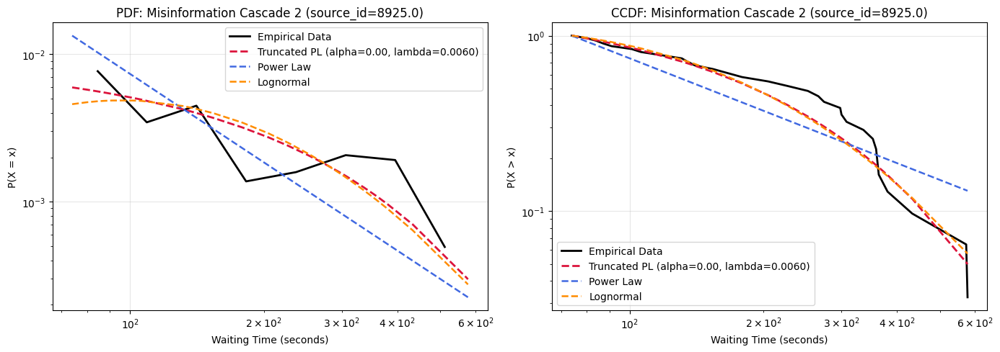


Analyzing cascade 3 (source_id=9660.0, size=437.0, waiting times=430.0)
TRUNCATED POWER LAW FIT RESULTS: Misinformation Cascade 3 (source_id=9660.0)
alpha: 1.5530
lambda: 0.006713
xmin: 82.0000
sigma: nan
Data points above xmin: 69 / 430 (16.05%)

TRUNCATED POWER LAW COMPARISONS

Truncated PL vs Power Law:
  R = 1.2500, p = 0.0608
  No significant difference

Truncated PL vs Lognormal:
  R = 0.2792, p = 0.7801
  No significant difference

Truncated PL vs Exponential:
  R = 0.7219, p = 0.4704
  No significant difference

KS distance (truncated power law): 0.0445
KS p-value (tail): 0.998263


/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:183: UserWarning: discrete=False but data exclusively contains integer values. Consider using discrete=True.
  warnings.warn('discrete=False but data exclusively contains integer values. Consider using discrete=True.')
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:808: UserWarning: Fitted parameters are very close to the edge of parameter ranges for distribution truncated_power_law; consider changing these ranges.
  warnings.warn(f'Fitted parameters are very close to the edge of parameter ranges for distribution {self.name}; consider changing these ranges.')


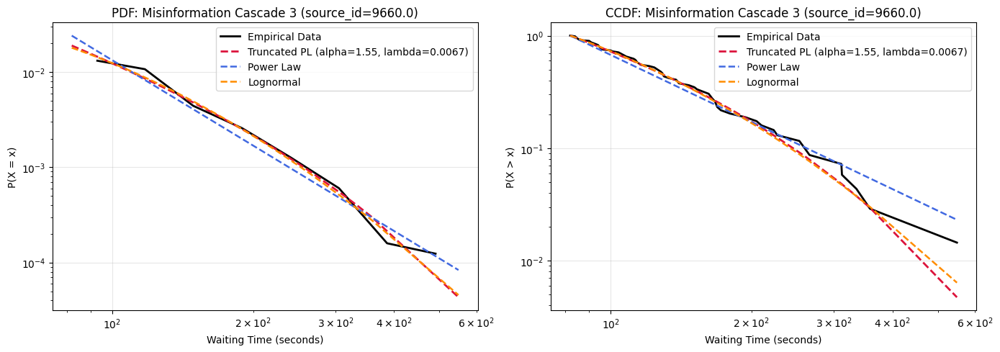

In [ ]:
# Show the TPL analysis for the cascades with misinformation
for i in range(len(cascade_params_mis)):
    cascade_id = cascade_params_mis.iloc[i]["source_id"]
    cascade_size = cascade_params_mis.iloc[i]["cascade_size"]
    waiting_times_count = cascade_params_mis.iloc[i]["waiting_times_count"]
    print(f"\nAnalyzing cascade {i+1} (source_id={cascade_id}, size={cascade_size}, waiting times={waiting_times_count})")
    
    # Collect waiting times for this specific cascade
    waiting_times = collect_waiting_times(full, found_mis[found_mis["id"] == cascade_id], max_waiting_time=600)
    
    # Fit TPL and generate report for this cascade
    fit_tpl_report(waiting_times, label=f"Misinformation Cascade {i+1} (source_id={cascade_id})", discrete=False)


In [ ]:
# Show the TPL analysis for the informative cascades
for i in range(len(cascade_params_info)):
    cascade_id = cascade_params_info.iloc[i]["source_id"]
    cascade_size = cascade_params_info.iloc[i]["cascade_size"]
    waiting_times_count = cascade_params_info.iloc[i]["waiting_times_count"]
    print(f"\nAnalyzing cascade {i+1} (source_id={cascade_id}, size={cascade_size}, waiting times={waiting_times_count})")
    
    # Collect waiting times for this specific cascade
    waiting_times = collect_waiting_times(full, found_info[found_info["id"] == cascade_id], max_waiting_time=600)
    
    # Fit TPL and generate report for this cascade
    fit_tpl_report(waiting_times, label=f"Informative Cascade {i+1} (source_id={cascade_id})", discrete=False)



Analyzing Poisson fit for cascade 1 (source_id=8556.0, size=6.0, waiting times=5.0)
Estimated Poisson lambda: nan
Misinformation Cascade 1 (source_id=8556.0): Not enough data to fit reliably (n=5).

Analyzing Poisson fit for cascade 2 (source_id=8925.0, size=59.0, waiting times=58.0)
Estimated Poisson lambda: nan
EXPONENTIAL FIT RESULTS: Misinformation Cascade 2 (source_id=8925.0)
Location (loc): 3.0000
Scale (1/lambda): 135.0517
Rate (lambda): 0.007405
Mean: 138.0517
Std Dev: 150.3898
Data points: 58

KS statistic (exponential): 0.2081
KS p-value: 0.0111143


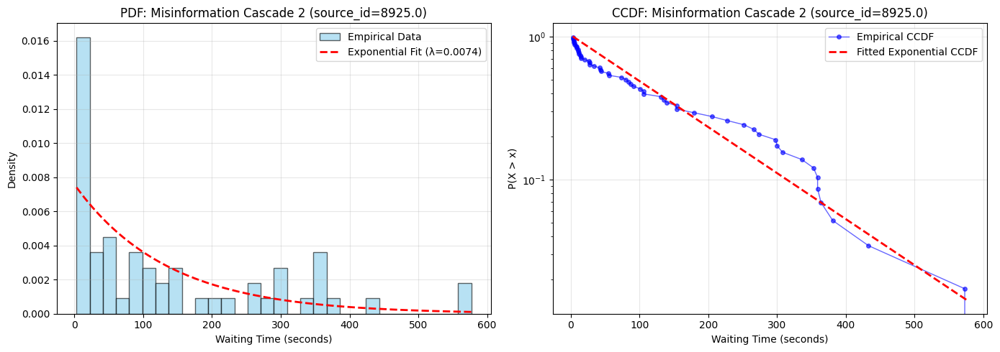


Analyzing Poisson fit for cascade 3 (source_id=9660.0, size=437.0, waiting times=430.0)
Estimated Poisson lambda: nan
EXPONENTIAL FIT RESULTS: Misinformation Cascade 3 (source_id=9660.0)
Location (loc): 1.0000
Scale (1/lambda): 43.7419
Rate (lambda): 0.022861
Mean: 44.7419
Std Dev: 58.5554
Data points: 430

KS statistic (exponential): 0.0920
KS p-value: 0.00127677


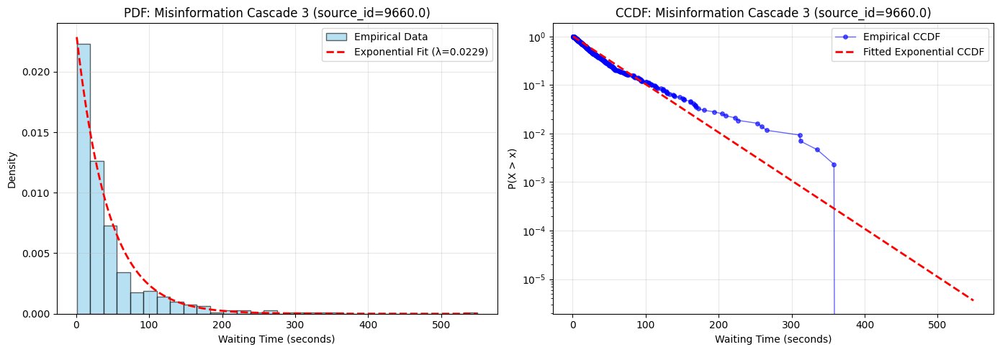

In [ ]:
# Show the Poisson analysis for the first 3 cascades with misinformation
for i in range(min(3, len(cascade_params_mis))):
    cascade_id = cascade_params_mis.iloc[i]["source_id"]
    cascade_size = cascade_params_mis.iloc[i]["cascade_size"]
    waiting_times_count = cascade_params_mis.iloc[i]["waiting_times_count"]
    poisson_lambda = cascade_params_mis.iloc[i]["poisson_lambda"]
    print(f"\nAnalyzing Poisson fit for cascade {i+1} (source_id={cascade_id}, size={cascade_size}, waiting times={waiting_times_count})")
    print(f"Estimated Poisson lambda: {poisson_lambda:.4f}")
    # Collect waiting times for this specific cascade
    waiting_times = collect_waiting_times(full, found_mis[found_mis["id"] == cascade_id], max_waiting_time=600)
    
    # Fit TPL and generate report for this cascade
    fit_poisson_report(waiting_times, label=f"Misinformation Cascade {i+1} (source_id={cascade_id})", discrete=False)


In [ ]:
# Fit TPL and Poisson distributions to each informative cascade and calculate parameters
cascade_params_inf = fit_cascade_distributions(full, found_inf, max_waiting_time=600, discrete=False)

print("=" * 70)
print("INFORMATIVE CASCADE DISTRIBUTION FITS")
print("=" * 70)
print(f"Total cascades analyzed: {len(cascade_params_inf)}")
print("\nSummary statistics:")
print(cascade_params_inf[["cascade_size", "waiting_times_count", "tpl_alpha", "tpl_lambda", "poisson_lambda"]].describe())
print("\nFirst 10 cascades:")
print(cascade_params_inf.head(10))


/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:183: UserWarning: discrete=False but data exclusively contains integer values. Consider using discrete=True.
  warnings.warn('discrete=False but data exclusively contains integer values. Consider using discrete=True.')
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:808: UserWarning: Fitted parameters are very close to the edge of parameter ranges for distribution truncated_power_law; consider changing these ranges.
  warnings.warn(f'Fitted parameters are very close to the edge of parameter ranges for distribution {self.name}; consider changing these ranges.')
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:183: UserWarning: discrete=False but data exclusively contains integer values. Consider using discrete=True.
  warnings.warn('discrete=False but data exclusively c

INFORMATIVE CASCADE DISTRIBUTION FITS
Total cascades analyzed: 673

Summary statistics:
       cascade_size  waiting_times_count   tpl_alpha    tpl_lambda  \
count    673.000000           673.000000  557.000000  5.570000e+02   
mean      40.049034            37.855869    1.091388  4.633606e-03   
std       83.718379            82.172393    0.740874  5.538298e-03   
min        4.000000             3.000000    0.000002  4.279093e-09   
25%        6.000000             4.000000    0.541194  1.958952e-03   
50%        9.000000             8.000000    1.133721  3.432645e-03   
75%       25.000000            23.000000    1.552977  5.845164e-03   
max      437.000000           430.000000    2.999997  8.975114e-02   

       poisson_lambda  
count             0.0  
mean              NaN  
std               NaN  
min               NaN  
25%               NaN  
50%               NaN  
75%               NaN  
max               NaN  

First 10 cascades:
   source_id  cascade_size  waiting_times_cou

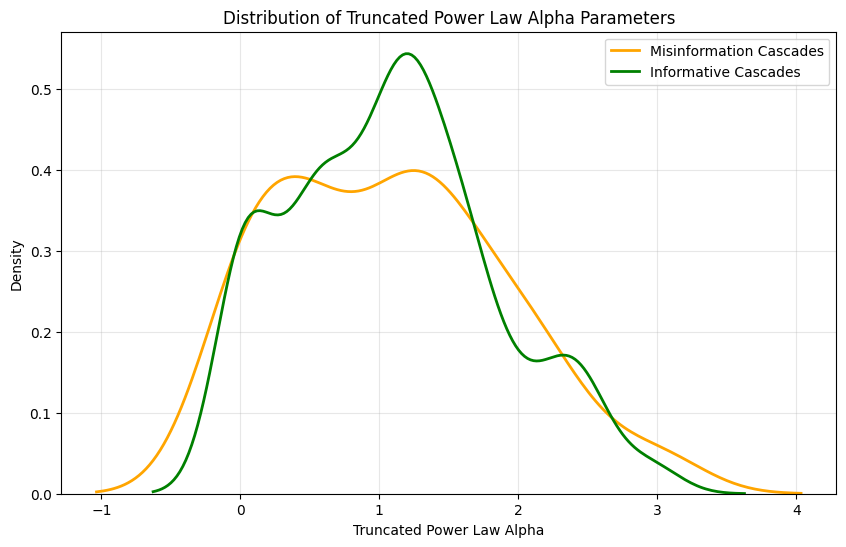

In [ ]:
# Plot distribution of TPL alpha parameters for misinformation cascades and informative cascades
plt.figure(figsize=(10, 6))
sns.kdeplot(data=cascade_params_mis["tpl_alpha"].dropna(), color="orange", label="Misinformation Cascades", linewidth=2)
sns.kdeplot(data=cascade_params_inf["tpl_alpha"].dropna(), color="green", label="Informative Cascades", linewidth=2)
plt.xlabel("Truncated Power Law Alpha")
plt.ylabel("Density")
plt.title("Distribution of Truncated Power Law Alpha Parameters")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

## Optimal Maximum Waiting Time Analysis
Find the max_waiting_time threshold that produces the best TPL fit

In [ ]:
def evaluate_max_waiting_time(full_df, sources_df, max_waiting_times, discrete=False):
    """
    Test different max_waiting_time thresholds and evaluate TPL fit quality for each.
    
    Returns a DataFrame with metrics for each threshold:
    - num_cascades: Total number of cascades found
    - num_cascades_fitted: Cascades with enough data points for fitting
    - avg_cascade_size: Average cascade size
    - avg_waiting_times: Average number of waiting times per cascade
    - mean_tpl_alpha: Mean power law exponent
    - std_tpl_alpha: Std dev of alpha values
    - mean_tpl_lambda: Mean exponential cutoff
    - mean_ks_stat: Mean KS test statistic (lower is better)
    - mean_ks_pvalue: Mean KS test p-value (higher is better)
    - pct_cascades_tpl_better: % of cascades where TPL beats power law
    """
    
    results = []
    
    for max_wt in max_waiting_times:
        # Fit cascades with this threshold
        cascade_params = fit_cascade_distributions(full_df, sources_df, max_waiting_time=max_wt, discrete=discrete)
        
        if len(cascade_params) == 0:
            continue
            
        # Calculate metrics
        num_cascades = len(cascade_params)
        num_fitted = cascade_params['tpl_alpha'].notna().sum()
        
        # Average cascade size and waiting times
        avg_cascade_size = cascade_params['cascade_size'].mean()
        avg_waiting_times = cascade_params['waiting_times_count'].mean()
        
        # TPL parameters statistics
        mean_alpha = cascade_params['tpl_alpha'].mean()
        std_alpha = cascade_params['tpl_alpha'].std()
        mean_lambda = cascade_params['tpl_lambda'].mean()
        
        # Collect KS statistics for each cascade
        ks_stats = []
        ks_pvalues = []
        tpl_better_count = 0
        
        for _, row in cascade_params.iterrows():
            source_id = row['source_id']
            waiting_times = collect_waiting_times(full_df, sources_df[sources_df['id'] == source_id], max_waiting_time=max_wt)
            
            if len(waiting_times) < 3:
                continue
                
            data = np.asarray(waiting_times, dtype=float)
            data = data[np.isfinite(data)]
            data = data[data > 0]
            
            if len(data) >= 3:
                try:
                    fit_tpl = powerlaw.Fit(data, discrete=discrete, verbose=False)
                    tpl = fit_tpl.truncated_power_law
                    
                    # KS test
                    xmin_tpl = getattr(tpl, "xmin", np.nan)
                    tail = data[data >= xmin_tpl]
                    if len(tail) > 0:
                        try:
                            ks_stat, ks_p = stats.kstest(tail, lambda x: tpl.cdf(x))
                            ks_stats.append(ks_stat)
                            ks_pvalues.append(ks_p)
                        except:
                            pass
                    
                    # Compare TPL vs Power Law
                    try:
                        R, p = fit_tpl.distribution_compare('truncated_power_law', 'power_law', normalized_ratio=True)
                        if p < 0.05 and R > 0:
                            tpl_better_count += 1
                    except:
                        pass
                except:
                    pass
        
        mean_ks_stat = np.mean(ks_stats) if ks_stats else np.nan
        mean_ks_pvalue = np.mean(ks_pvalues) if ks_pvalues else np.nan
        pct_tpl_better = (tpl_better_count / num_fitted * 100) if num_fitted > 0 else np.nan
        
        results.append({
            'max_waiting_time': max_wt,
            'num_cascades': num_cascades,
            'num_cascades_fitted': num_fitted,
            'avg_cascade_size': avg_cascade_size,
            'avg_waiting_times_count': avg_waiting_times,
            'mean_tpl_alpha': mean_alpha,
            'std_tpl_alpha': std_alpha,
            'mean_tpl_lambda': mean_lambda,
            'mean_ks_stat': mean_ks_stat,
            'mean_ks_pvalue': mean_ks_pvalue,
            'pct_cascades_tpl_better': pct_tpl_better
        })
    
    return pd.DataFrame(results)

# Test a range of max_waiting_time values (in seconds)
# Start from 30s (0.5 min) to 3600s (60 min)
max_waiting_times_to_test = [30, 60, 120, 180, 300, 600, 900, 1200, 1800, 2400, 3600]

print("Testing optimal max_waiting_time for misinformation cascades...")
print("This may take a few minutes...\n")

optimal_results_mis = evaluate_max_waiting_time(full, found_mis, max_waiting_times_to_test, discrete=False)

print("MISINFORMATION CASCADES: OPTIMAL MAX_WAITING_TIME ANALYSIS")
print("=" * 80)
print(optimal_results_mis.to_string(index=False))
print("=" * 80)


Testing optimal max_waiting_time for misinformation cascades...
This may take a few minutes...



/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/fitting.py:412: UserWarning: Less than 2 unique data values for fitting xmin! Returning nans.
  warnings.warn("Less than 2 unique data values for fitting xmin! Returning nans.")
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:183: UserWarning: discrete=False but data exclusively contains integer values. Consider using discrete=True.
  warnings.warn('discrete=False but data exclusively contains integer values. Consider using discrete=True.')
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:2472: RuntimeWarning: invalid value encountered in scalar divide
  params["alpha"] = 1 + n / np.sum(np.log(data / self.xmin))
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/numpy/_core/fromnumeric.py:3824: RuntimeWarning: Mean of empty slice
  return _methods._mean(a, 

MISINFORMATION CASCADES: OPTIMAL MAX_WAITING_TIME ANALYSIS
 max_waiting_time  num_cascades  num_cascades_fitted  avg_cascade_size  avg_waiting_times_count  mean_tpl_alpha  std_tpl_alpha  mean_tpl_lambda  mean_ks_stat  mean_ks_pvalue  pct_cascades_tpl_better
               30             1                    0          4.000000                 3.000000             NaN            NaN              NaN           NaN             NaN                      NaN
               60            15                    6          5.333333                 4.266667        0.991296       1.535736         0.052528      0.324049        0.605429                16.666667
              120            31                   17         10.741935                 9.483871        0.557578       0.886354         0.033440      0.286469        0.623864                23.529412
              180            40                   29         14.950000                13.700000        0.844294       0.836110         0.015144  

In [ ]:
# Test for informative cascades as well
print("\nTesting optimal max_waiting_time for informative cascades...")
print("This may take a few minutes...\n")

optimal_results_inf = evaluate_max_waiting_time(full, found_inf, max_waiting_times_to_test, discrete=False)

print("INFORMATIVE CASCADES: OPTIMAL MAX_WAITING_TIME ANALYSIS")
print("=" * 80)
print(optimal_results_inf.to_string(index=False))
print("=" * 80)



Testing optimal max_waiting_time for informative cascades...
This may take a few minutes...



/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:183: UserWarning: discrete=False but data exclusively contains integer values. Consider using discrete=True.
  warnings.warn('discrete=False but data exclusively contains integer values. Consider using discrete=True.')
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/fitting.py:528: UserWarning: No valid values for xmin found.
  warnings.warn('No valid values for xmin found.')
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:183: UserWarning: discrete=False but data exclusively contains integer values. Consider using discrete=True.
  warnings.warn('discrete=False but data exclusively contains integer values. Consider using discrete=True.')
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:743: OptimizeWarning: Initial guess is not 

INFORMATIVE CASCADES: OPTIMAL MAX_WAITING_TIME ANALYSIS
 max_waiting_time  num_cascades  num_cascades_fitted  avg_cascade_size  avg_waiting_times_count  mean_tpl_alpha  std_tpl_alpha  mean_tpl_lambda  mean_ks_stat  mean_ks_pvalue  pct_cascades_tpl_better
               30            57                   25          6.315789                 4.877193        0.433175       0.651864         0.113345      0.275760        0.670864                20.000000
               60           132                   83          9.159091                 7.787879        0.457911       0.633149         0.053986      0.276719        0.597964                28.915663
              120           248                  169         16.427419                14.455645        0.555558       0.643536         0.028109      0.247376        0.658607                30.177515
              180           334                  251         18.892216                17.005988        0.694891       0.766944         0.019089     

/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/fitting.py:412: UserWarning: Less than 2 unique data values for fitting xmin! Returning nans.
  warnings.warn("Less than 2 unique data values for fitting xmin! Returning nans.")
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:183: UserWarning: discrete=False but data exclusively contains integer values. Consider using discrete=True.
  warnings.warn('discrete=False but data exclusively contains integer values. Consider using discrete=True.')
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:2472: RuntimeWarning: invalid value encountered in scalar divide
  params["alpha"] = 1 + n / np.sum(np.log(data / self.xmin))
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/numpy/_core/fromnumeric.py:3824: RuntimeWarning: Mean of empty slice
  return _methods._mean(a, 

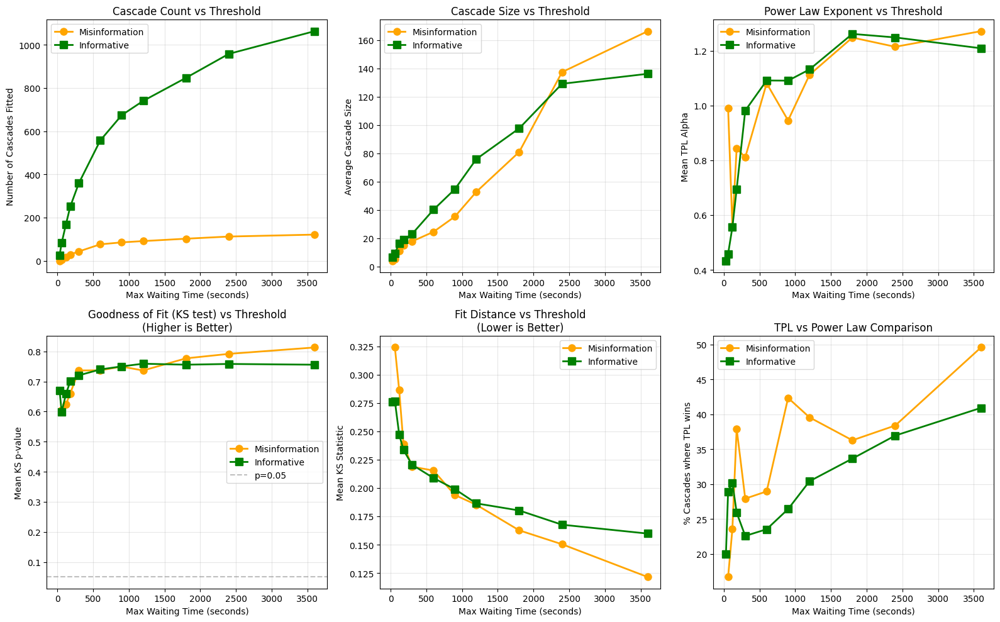


RECOMMENDATIONS FOR OPTIMAL MAX_WAITING_TIME

MISINFORMATION CASCADES:
--------------------------------------------------------------------------------
Best KS p-value: 3600s (p=0.813074)
Best KS statistic: 3600s (KS=0.121428)
Most consistent alpha: 3600s (std=0.485942)

INFORMATIVE CASCADES:
--------------------------------------------------------------------------------
Best KS p-value: 1200s (p=0.759062)
Best KS statistic: 3600s (KS=0.159762)
Most consistent alpha: 3600s (std=0.549508)



In [ ]:
# Create comprehensive visualization comparing metrics across thresholds
fig, axes = plt.subplots(2, 3, figsize=(16, 10))

# Plot 1: Number of cascades fitted
axes[0, 0].plot(optimal_results_mis['max_waiting_time'], optimal_results_mis['num_cascades_fitted'], 
                'o-', color='orange', linewidth=2, markersize=8, label='Misinformation')
axes[0, 0].plot(optimal_results_inf['max_waiting_time'], optimal_results_inf['num_cascades_fitted'], 
                's-', color='green', linewidth=2, markersize=8, label='Informative')
axes[0, 0].set_xlabel('Max Waiting Time (seconds)')
axes[0, 0].set_ylabel('Number of Cascades Fitted')
axes[0, 0].set_title('Cascade Count vs Threshold')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Plot 2: Average cascade size
axes[0, 1].plot(optimal_results_mis['max_waiting_time'], optimal_results_mis['avg_cascade_size'], 
                'o-', color='orange', linewidth=2, markersize=8, label='Misinformation')
axes[0, 1].plot(optimal_results_inf['max_waiting_time'], optimal_results_inf['avg_cascade_size'], 
                's-', color='green', linewidth=2, markersize=8, label='Informative')
axes[0, 1].set_xlabel('Max Waiting Time (seconds)')
axes[0, 1].set_ylabel('Average Cascade Size')
axes[0, 1].set_title('Cascade Size vs Threshold')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# Plot 3: Mean TPL Alpha
axes[0, 2].plot(optimal_results_mis['max_waiting_time'], optimal_results_mis['mean_tpl_alpha'], 
                'o-', color='orange', linewidth=2, markersize=8, label='Misinformation')
axes[0, 2].plot(optimal_results_inf['max_waiting_time'], optimal_results_inf['mean_tpl_alpha'], 
                's-', color='green', linewidth=2, markersize=8, label='Informative')
axes[0, 2].set_xlabel('Max Waiting Time (seconds)')
axes[0, 2].set_ylabel('Mean TPL Alpha')
axes[0, 2].set_title('Power Law Exponent vs Threshold')
axes[0, 2].legend()
axes[0, 2].grid(True, alpha=0.3)

# Plot 4: Mean KS p-value (higher is better)
axes[1, 0].plot(optimal_results_mis['max_waiting_time'], optimal_results_mis['mean_ks_pvalue'], 
                'o-', color='orange', linewidth=2, markersize=8, label='Misinformation')
axes[1, 0].plot(optimal_results_inf['max_waiting_time'], optimal_results_inf['mean_ks_pvalue'], 
                's-', color='green', linewidth=2, markersize=8, label='Informative')
axes[1, 0].axhline(y=0.05, color='gray', linestyle='--', alpha=0.5, label='p=0.05')
axes[1, 0].set_xlabel('Max Waiting Time (seconds)')
axes[1, 0].set_ylabel('Mean KS p-value')
axes[1, 0].set_title('Goodness of Fit (KS test) vs Threshold\n(Higher is Better)')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# Plot 5: Mean KS statistic (lower is better)
axes[1, 1].plot(optimal_results_mis['max_waiting_time'], optimal_results_mis['mean_ks_stat'], 
                'o-', color='orange', linewidth=2, markersize=8, label='Misinformation')
axes[1, 1].plot(optimal_results_inf['max_waiting_time'], optimal_results_inf['mean_ks_stat'], 
                's-', color='green', linewidth=2, markersize=8, label='Informative')
axes[1, 1].set_xlabel('Max Waiting Time (seconds)')
axes[1, 1].set_ylabel('Mean KS Statistic')
axes[1, 1].set_title('Fit Distance vs Threshold\n(Lower is Better)')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

# Plot 6: % of cascades where TPL beats Power Law
axes[1, 2].plot(optimal_results_mis['max_waiting_time'], optimal_results_mis['pct_cascades_tpl_better'], 
                'o-', color='orange', linewidth=2, markersize=8, label='Misinformation')
axes[1, 2].plot(optimal_results_inf['max_waiting_time'], optimal_results_inf['pct_cascades_tpl_better'], 
                's-', color='green', linewidth=2, markersize=8, label='Informative')
axes[1, 2].set_xlabel('Max Waiting Time (seconds)')
axes[1, 2].set_ylabel('% Cascades where TPL wins')
axes[1, 2].set_title('TPL vs Power Law Comparison')
axes[1, 2].legend()
axes[1, 2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print recommendations
print("\n" + "=" * 80)
print("RECOMMENDATIONS FOR OPTIMAL MAX_WAITING_TIME")
print("=" * 80)

# Find optimal based on different criteria
print("\nMISINFORMATION CASCADES:")
print("-" * 80)
best_ks_p_mis = optimal_results_mis.loc[optimal_results_mis['mean_ks_pvalue'].idxmax()]
print(f"Best KS p-value: {best_ks_p_mis['max_waiting_time']:.0f}s (p={best_ks_p_mis['mean_ks_pvalue']:.6f})")

best_ks_stat_mis = optimal_results_mis.loc[optimal_results_mis['mean_ks_stat'].idxmin()]
print(f"Best KS statistic: {best_ks_stat_mis['max_waiting_time']:.0f}s (KS={best_ks_stat_mis['mean_ks_stat']:.6f})")

best_alpha_consistency_mis = optimal_results_mis.loc[optimal_results_mis['std_tpl_alpha'].idxmin()]
print(f"Most consistent alpha: {best_alpha_consistency_mis['max_waiting_time']:.0f}s (std={best_alpha_consistency_mis['std_tpl_alpha']:.6f})")

print("\nINFORMATIVE CASCADES:")
print("-" * 80)
best_ks_p_inf = optimal_results_inf.loc[optimal_results_inf['mean_ks_pvalue'].idxmax()]
print(f"Best KS p-value: {best_ks_p_inf['max_waiting_time']:.0f}s (p={best_ks_p_inf['mean_ks_pvalue']:.6f})")

best_ks_stat_inf = optimal_results_inf.loc[optimal_results_inf['mean_ks_stat'].idxmin()]
print(f"Best KS statistic: {best_ks_stat_inf['max_waiting_time']:.0f}s (KS={best_ks_stat_inf['mean_ks_stat']:.6f})")

best_alpha_consistency_inf = optimal_results_inf.loc[optimal_results_inf['std_tpl_alpha'].idxmin()]
print(f"Most consistent alpha: {best_alpha_consistency_inf['max_waiting_time']:.0f}s (std={best_alpha_consistency_inf['std_tpl_alpha']:.6f})")

print("\n" + "=" * 80)


In [ ]:
# Use the optimal max_waiting_time based on your preferred criterion
# Edit this value based on the recommendations above

OPTIMAL_MAX_WAITING_TIME_MIS = 600  # Change this to your chosen optimal value for misinformation
OPTIMAL_MAX_WAITING_TIME_INF = 600  # Change this to your chosen optimal value for informative

# Re-run analysis with optimal parameters
print("RE-ANALYZING WITH OPTIMAL MAX_WAITING_TIME")
print("=" * 80)

cascade_params_mis_optimal = fit_cascade_distributions(full, found_mis, max_waiting_time=OPTIMAL_MAX_WAITING_TIME_MIS, discrete=False)
cascade_params_inf_optimal = fit_cascade_distributions(full, found_inf, max_waiting_time=OPTIMAL_MAX_WAITING_TIME_INF, discrete=False)

print(f"\nMISINFORMATION (max_waiting_time={OPTIMAL_MAX_WAITING_TIME_MIS}s):")
print(f"  Cascades analyzed: {len(cascade_params_mis_optimal)}")
print(f"  Mean alpha: {cascade_params_mis_optimal['tpl_alpha'].mean():.4f} ± {cascade_params_mis_optimal['tpl_alpha'].std():.4f}")
print(f"  Mean lambda: {cascade_params_mis_optimal['tpl_lambda'].mean():.6f}")

print(f"\nINFORMATIVE (max_waiting_time={OPTIMAL_MAX_WAITING_TIME_INF}s):")
print(f"  Cascades analyzed: {len(cascade_params_inf_optimal)}")
print(f"  Mean alpha: {cascade_params_inf_optimal['tpl_alpha'].mean():.4f} ± {cascade_params_inf_optimal['tpl_alpha'].std():.4f}")
print(f"  Mean lambda: {cascade_params_inf_optimal['tpl_lambda'].mean():.6f}")

print("\n" + "=" * 80)
print("Update OPTIMAL_MAX_WAITING_TIME_MIS and OPTIMAL_MAX_WAITING_TIME_INF above")
print("and re-run this cell to analyze with different thresholds.")
print("=" * 80)


RE-ANALYZING WITH OPTIMAL MAX_WAITING_TIME


/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/fitting.py:528: UserWarning: No valid values for xmin found.
  warnings.warn('No valid values for xmin found.')
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:183: UserWarning: discrete=False but data exclusively contains integer values. Consider using discrete=True.
  warnings.warn('discrete=False but data exclusively contains integer values. Consider using discrete=True.')
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:743: OptimizeWarning: Initial guess is not within the specified bounds
  result = scipy.optimize.minimize(fit_function,
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:808: UserWarning: Fitted parameters are very close to the edge of parameter ranges for distribution truncated_power_law; consider changing the


MISINFORMATION (max_waiting_time=600s):
  Cascades analyzed: 89
  Mean alpha: 1.0809 ± 0.8203
  Mean lambda: 0.004764

INFORMATIVE (max_waiting_time=600s):
  Cascades analyzed: 673
  Mean alpha: 1.0914 ± 0.7409
  Mean lambda: 0.004634

Update OPTIMAL_MAX_WAITING_TIME_MIS and OPTIMAL_MAX_WAITING_TIME_INF above
and re-run this cell to analyze with different thresholds.


/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:183: UserWarning: discrete=False but data exclusively contains integer values. Consider using discrete=True.
  warnings.warn('discrete=False but data exclusively contains integer values. Consider using discrete=True.')
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:183: UserWarning: discrete=False but data exclusively contains integer values. Consider using discrete=True.
  warnings.warn('discrete=False but data exclusively contains integer values. Consider using discrete=True.')
/Library/Frameworks/Python.framework/Versions/3.14/lib/python3.14/site-packages/powerlaw/distributions.py:183: UserWarning: discrete=False but data exclusively contains integer values. Consider using discrete=True.
  warnings.warn('discrete=False but data exclusively contains integer values. Consider using discrete=True.')
/Library/Frameworks/Pytho

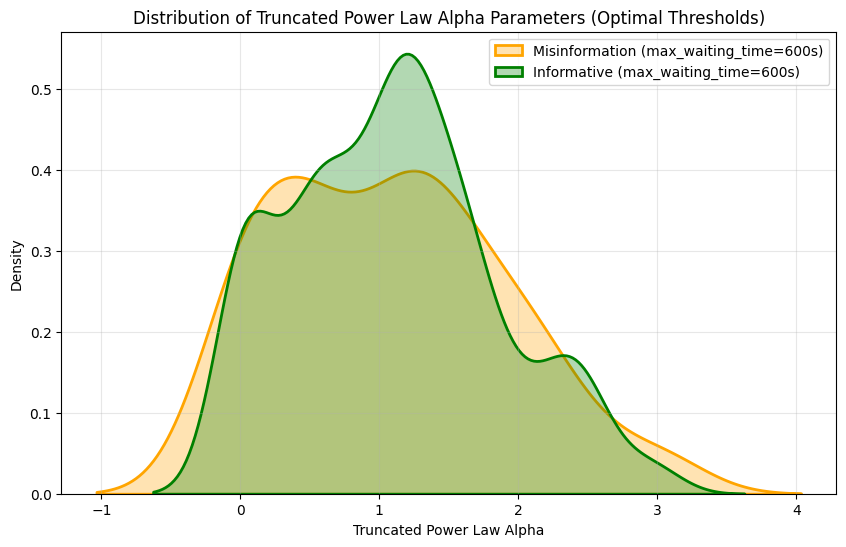

In [ ]:
# Final comprehensive visualization comparing TPL alpha distributions for misinformation vs informative cascades with optimal thresholds
plt.figure(figsize=(10, 6))
sns.kdeplot(data=cascade_params_mis_optimal["tpl_alpha"].dropna(), color="orange", label=f"Misinformation (max_waiting_time={OPTIMAL_MAX_WAITING_TIME_MIS}s)", linewidth=2, fill=True, alpha=0.3)
sns.kdeplot(data=cascade_params_inf_optimal["tpl_alpha"].dropna(), color="green", label=f"Informative (max_waiting_time={OPTIMAL_MAX_WAITING_TIME_INF}s)", linewidth=2, fill=True, alpha=0.3)
plt.xlabel("Truncated Power Law Alpha")
plt.ylabel("Density")
plt.title("Distribution of Truncated Power Law Alpha Parameters (Optimal Thresholds)")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()  